In [19]:
import numpy as np
import pandas as pd
%matplotlib widget
import seaborn as sns
from matplotlib import pyplot as plt
from collections import Counter
from sklearn.cluster import DBSCAN

In [20]:
df_train_mar = pd.read_excel('Задача 1. Датасет 1. Тренировочный размеченный.xlsx')
df_test_mar = pd.read_excel('Задача 1. Датасет 2. Тестовый размеченный.xlsx')
df_train_raw = pd.read_excel('Задача 1. Датасет 1. Тренировочный неразмеченный.xlsx')
df_test_raw = pd.read_excel('Задача 1. Датасет 2. Тестовый неразмеченный.xlsx')

In [21]:
print('df_train_raw.shape',df_train_raw.shape)
print('df_train_mar.shape',df_train_mar.shape)
print('df_train_raw.shape',df_test_raw.shape)
print('df_train_mar.shape',df_test_mar.shape)

df_train_raw.shape (37339, 45)
df_train_mar.shape (36816, 45)
df_train_raw.shape (42932, 45)
df_train_mar.shape (41160, 45)


## Функции

In [22]:
def get_marks(ser_raw, ser_marked):
    """Функция формирует разметку аномалий на основании размеченных
       и неразмеченных данных.
    Аргументы:
    ser_raw - объект типа Series, сигнал датчика до удаления аномалий,
    ser_marked - объект типа Series, сигнал датчика после удаления аномалий.
    Возвращает:
    разметку аномалий по отсчетам датчиков в виде списка.
    """
    n_train = 0
    n_test_list = []
    r=len(n_test_list)
    for n_train in range(ser_marked.shape[0]):
        while ser_raw[r]!=ser_marked[n_train]:
            n_test_list.append(1)
            r=len(n_test_list)
        n_test_list.append(0)
        r=len(n_test_list)    
    return n_test_list  

In [23]:
def get_outliers_tres(ser_raw, k=3):
    """Функция формирует разметку аномалий пороговой фильтрации.
    Аргументы:
    ser_raw - объект типа Series, сигнал датчика до удаления аномалий,
    k - коэффициент порога определения аномалий.
    Возвращает:
    разметку аномалий по отсчетам датчиков в виде массива.
    """
    median_ = ser_raw.median()
    band_up = median_ + (np.percentile(ser_raw, 99) - median_)*k
    band_low = median_ - (median_- np.percentile(ser_raw, 1))*k
    outliers_up = np.where(ser_raw>band_up, 1, 0)
    outliers_down = np.where(ser_raw<band_low, 1, 0)
    outliers = outliers_up + outliers_down
    return outliers

In [24]:
def get_diag_corr(df):
    """Функция формирует диагональную половину матрицы корреляции без главной диагонали.
    Аргументы:
    df - входной датафрейм.
    Возвращает:
    обрезанную матрицу корреляции.
    """
    corr_ = df.corr()
    mask_1 = np.triu(np.ones_like(corr_))
    mask_2 = np.eye(corr_.shape[0])
    return corr_*(mask_1 - mask_2)

Получаем разметку аномалий

In [25]:
y_raw = get_marks(df_train_raw.T.iloc[2], df_train_mar.T.iloc[2])
print(f'Хороших отсчетов в разметке {y_raw.count(0)}')
print(f'Плохих отсчетов в разметке {y_raw.count(1)}')
print(f'Всего отсчетов в разметке {len(y_raw)}')

Хороших отсчетов в разметке 36816
Плохих отсчетов в разметке 523
Всего отсчетов в разметке 37339


Визуализация одного датчика

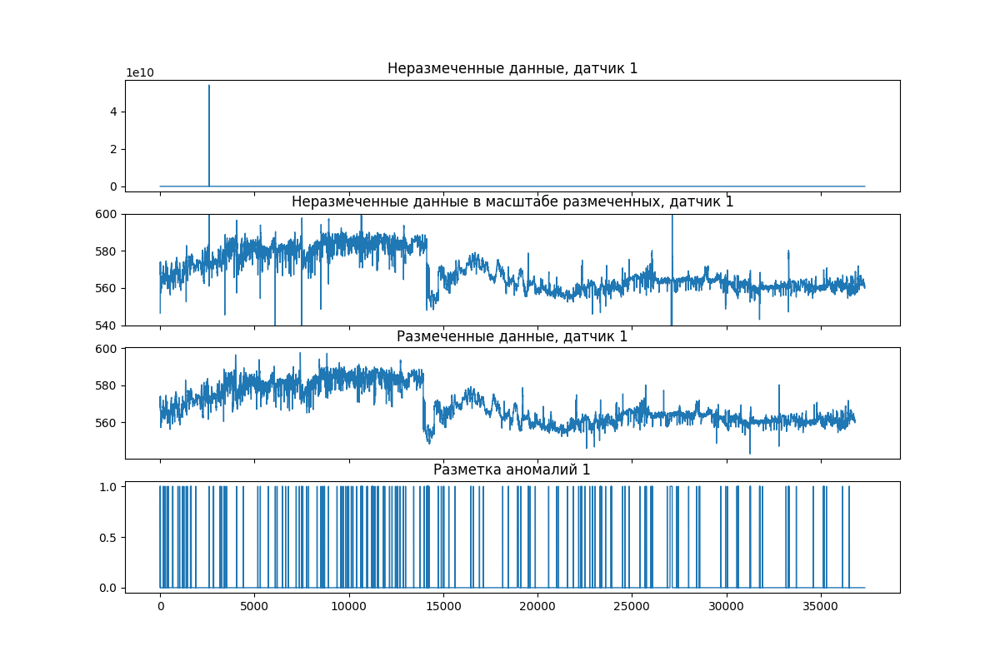

In [26]:
i_sensor = 1  # номер датчика

fig, axx = plt.subplots(4, 1, sharex=True, figsize=(12, 8))

plt.sca(axx[0])
plt.plot(df_train_raw.T.iloc[i_sensor+1], lw=1)
plt.title(f'Неразмеченные данные, датчик {i_sensor}')

plt.sca(axx[1])
plt.plot(df_train_raw.T.iloc[i_sensor+1], lw=1)
plt.title(f'Неразмеченные данные в масштабе размеченных, датчик {i_sensor}')
axx[1].set_ylim(540,600)

plt.sca(axx[2])
plt.plot(df_train_mar.T.iloc[i_sensor+1], lw=1)
plt.title(f'Размеченные данные, датчик {i_sensor}')

plt.sca(axx[3])
plt.plot(np.arange(len(y_raw)), y_raw, lw=1)
plt.title(f'Разметка аномалий {i_sensor}');

В неразмеченных данных присутствуют большие выбросы. Удаляем их пороговой фильтрацией.

In [27]:
# Получаем разметку без выбросов
k = 3 # в main k=4
outliers = np.ones((df_train_raw.shape[1]-1, df_train_raw.shape[0]),dtype=int)
for i_sensor in range (1, df_train_raw.shape[1]):
    ser_train = df_train_raw.T.iloc[i_sensor]
    outliers[i_sensor-1]  = get_outliers_tres(ser_train,k)
    # Новая разметка без больших выбросов    
pred_y_tres = np.where(outliers.sum(axis=0) != 0, 1, 0)

print(f'Размечено выбросов {pred_y_tres.sum()}')
print(f'Размечено без выбросов {np.where(pred_y_tres==0, 1, 0).sum()}')
print(f'Хороших отсчетов, ошибочно помеченных плохими пороговым фильтром {np.where((np.array(y_raw)-pred_y_tres)==-1,1,0).sum()}')
print(f'Выбросов, пропущенных пороговым фильтром {np.where((np.array(y_raw)-pred_y_tres)==1,1,0).sum()}')

Размечено выбросов 184
Размечено без выбросов 37155
Хороших отсчетов, ошибочно помеченных плохими пороговым фильтром 0
Выбросов, пропущенных пороговым фильтром 339


Удаляем большие выбросы из df_train_raw, получаем df_tres_clear

In [28]:
# Формируем train_clear без выбросов
drop_ind = np.delete(np.arange(len(pred_y_tres)), np.where(pred_y_tres==0)[0], axis=0).astype(int)
df_tres_clear = df_train_raw.drop(drop_ind, axis=0).reset_index(drop=True)    

In [29]:
# Формируем список признаков
cols_init = list(df_tres_clear.columns)[1:]
# Проверяем, есть ли признаки с очень высокой корреляцией
corr_tres = 0.999         # порог коэффициента корреляции
diag_corr = get_diag_corr(df_tres_clear[cols_init])
drop_list = list(set(np.where(diag_corr > corr_tres)[1]))  # список признаков с очень высокой корреляцией
print(f'{len(drop_list)} признака имеют коэффициент корреляции выше {corr_tres}')

22 признака имеют коэффициент корреляции выше 0.999


Удаляем признаки с корреляцией больше порога corr_tres = 0.999  
Предположительно, это резервирование датчиков.  

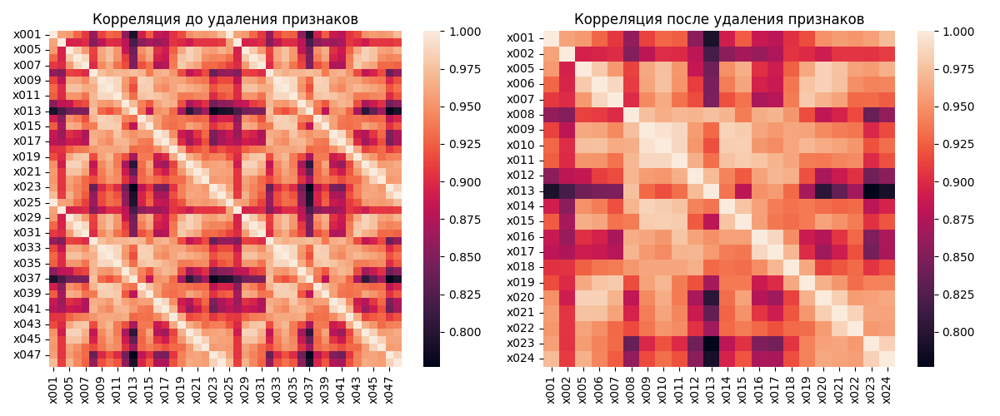

После устранения мультиколлинеарности осталось 22 признака:
 ['х001', 'х002', 'х005', 'х006', 'х007', 'х008', 'х009', 'х010', 'х011', 'х012', 'х013', 'х014', 'х015', 'х016', 'х017', 'х018', 'х019', 'х020', 'х021', 'х022', 'х023', 'х024']


In [30]:
# Формируем список признаков
cols_init = list(df_tres_clear.columns)[1:]
X_for_fit = df_tres_clear.copy()

if len(drop_list) != 0:  # Проверяем, надо ли удалять признаки
    while len(drop_list) > 1:   # Если удалять признаки надо, удаляем по одному
        num_cols=list(X_for_fit.columns)[1:]
        diag_corr = get_diag_corr(X_for_fit[num_cols])
        drop_cols=np.where(diag_corr > corr_tres)[1]
        drop_list = list(set(drop_cols))
        drop_curr = drop_list[0]
        drop_name = diag_corr.columns[drop_curr]
        X_for_fit.drop(drop_name, axis=1, inplace=True)
        
corr_1 = df_tres_clear.corr()
num_cols=list(X_for_fit.columns)[1:]
corr_2 = X_for_fit.corr()

# Визуализация
fig, axx = plt.subplots(1, 2, figsize=(12, 5))
plt.sca(axx[0])
sns.heatmap(corr_1); #, annot=True
plt.title('Корреляция до удаления признаков', fontsize=12)

plt.sca(axx[1])
sns.heatmap(corr_2); #, annot=True
plt.title('Корреляция после удаления признаков', fontsize=12)

plt.tight_layout()
plt.show()
print(f'После устранения мультиколлинеарности осталось {len(num_cols)} признака:\n {num_cols}')

In [31]:
# Формируем списки пар признаков с высокой корреляцией 
k_corr = 0.98 # Порог, когда признаки считаются высококоррелированными
diag_corr = get_diag_corr(X_for_fit)
diag_arr = np.array(diag_corr)
list_1_hicorr_pair = np.where(diag_arr >= k_corr)[0]
list_2_hicorr_pair = np.where(diag_arr >= k_corr)[1]

list_1_hicorr_names = []
list_2_hicorr_names = []
for i in range(len(list_1_hicorr_pair)):
    list_1_hicorr_names.append(num_cols[list_1_hicorr_pair[i]])
    list_2_hicorr_names.append(num_cols[list_2_hicorr_pair[i]])

print(list_1_hicorr_names)
print(list_2_hicorr_names)

['х005', 'х006', 'х006', 'х007', 'х009', 'х009', 'х009', 'х009', 'х010', 'х010', 'х010', 'х011', 'х016', 'х020', 'х021', 'х023']
['х020', 'х007', 'х020', 'х019', 'х010', 'х011', 'х014', 'х015', 'х011', 'х014', 'х015', 'х015', 'х017', 'х021', 'х022', 'х024']


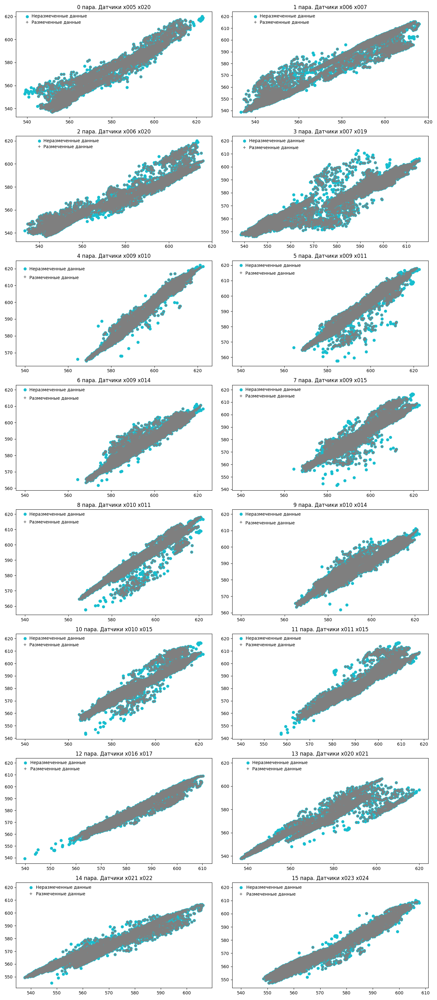

In [32]:
n_graf = len(list_1_hicorr_pair)
fig, axx = plt.subplots(n_graf//2, 2, figsize=(14, n_graf*2))
for i in range (n_graf):
    plt.sca(axx[i//2,i%2])
    plt.scatter(data=df_tres_clear, x=list_1_hicorr_names[i], y=list_2_hicorr_names[i], c=np.full((df_tres_clear.shape[0],),'#17becf'))
    plt.title(f'{i} пара. Датчики {list_1_hicorr_names[i]} {list_2_hicorr_names[i]}')
    plt.scatter(data=df_train_mar, x=list_1_hicorr_names[i], y=list_2_hicorr_names[i], c=np.full((df_train_mar.shape[0],),'#7f7f7f'), marker='+')
    # легенда
    plt.scatter(x=540, y=620, c='#17becf')
    plt.scatter(x=540, y=615, c='#7f7f7f', marker='+')
    plt.annotate('Неразмеченные данные', (542,619))
    plt.annotate('Размеченные данные', (542,614))
plt.tight_layout()
plt.show()

Проводим кластеризацию неразмеченных данных с целью выделения аномалий

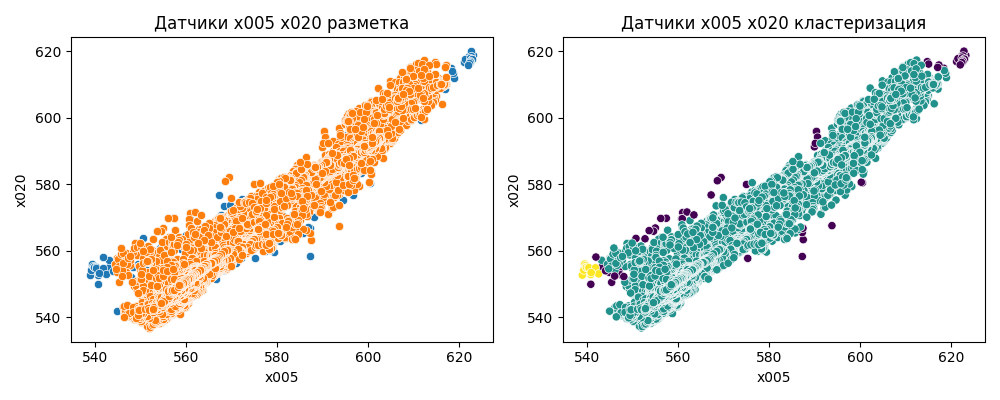

In [33]:

i=0   # номер пары датчиков


X = df_tres_clear[[list_1_hicorr_names[i], list_2_hicorr_names[i]]]
clustering = DBSCAN(eps=2.5, min_samples=20).fit(X)


fig, axx = plt.subplots(1, 2, figsize=(10, 4))
plt.sca(axx[0])
sns.scatterplot(data=df_tres_clear, x=list_1_hicorr_names[i], y=list_2_hicorr_names[i])
sns.scatterplot(data=df_train_mar, x=list_1_hicorr_names[i], y=list_2_hicorr_names[i])
plt.title(f'Датчики {list_1_hicorr_names[i]} {list_2_hicorr_names[i]} разметка')
plt.sca(axx[1])
sns.scatterplot(data=df_tres_clear, x=list_1_hicorr_names[i], y=list_2_hicorr_names[i], c=clustering.labels_)
plt.title(f'Датчики {list_1_hicorr_names[i]} {list_2_hicorr_names[i]} кластеризация')
plt.tight_layout()
plt.show()

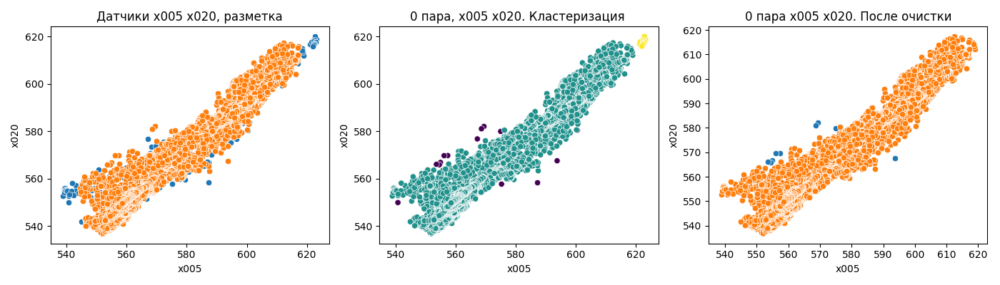

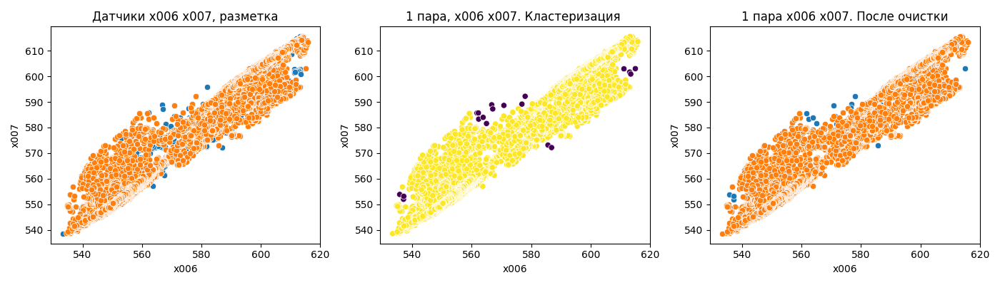

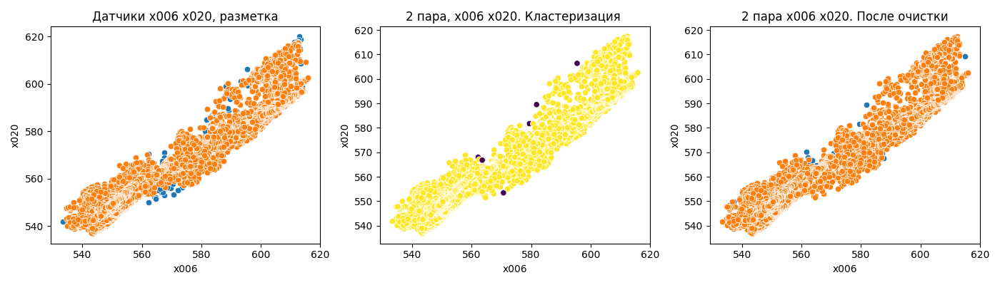

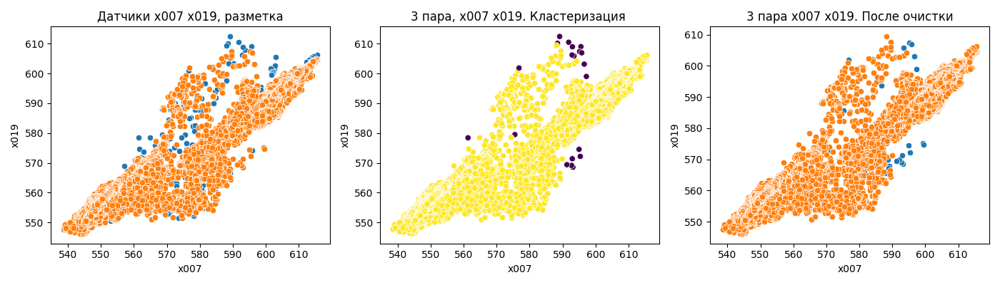

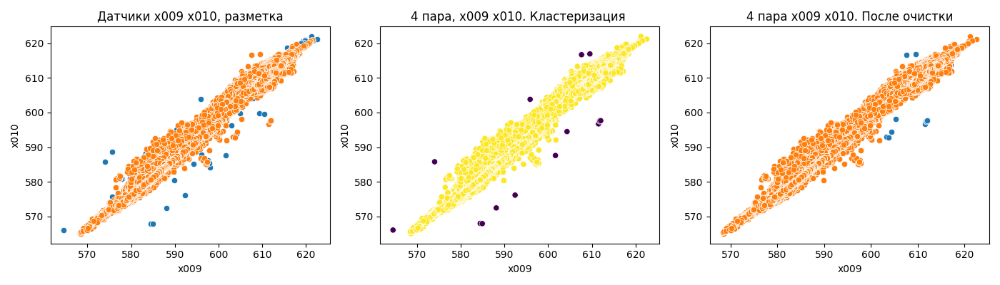

...

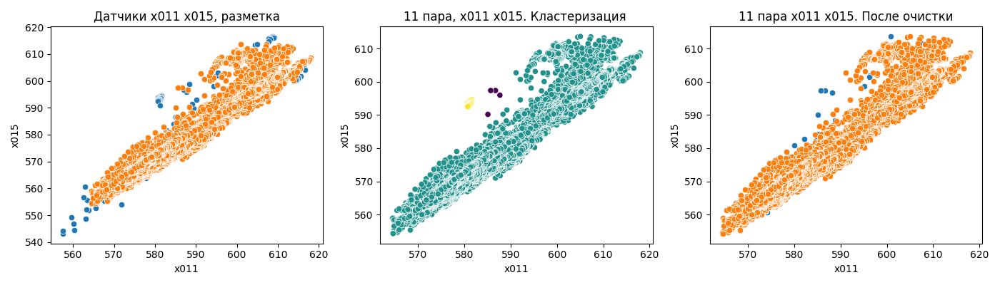

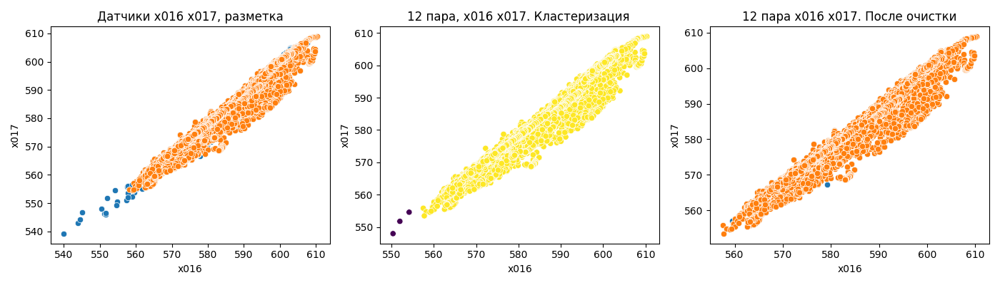

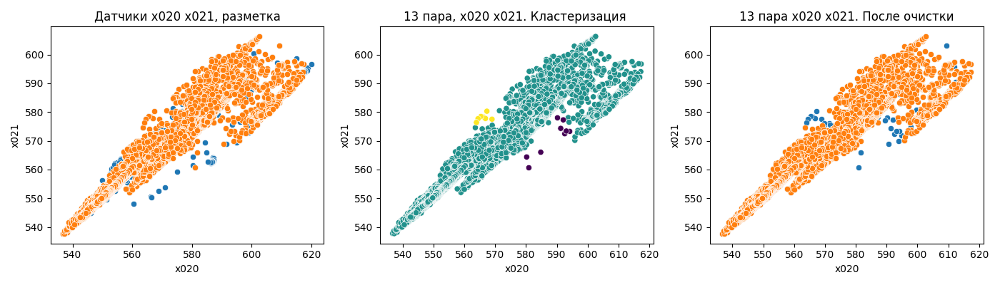

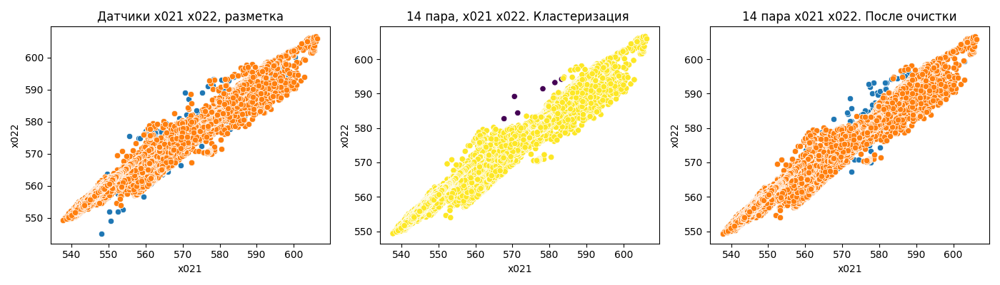

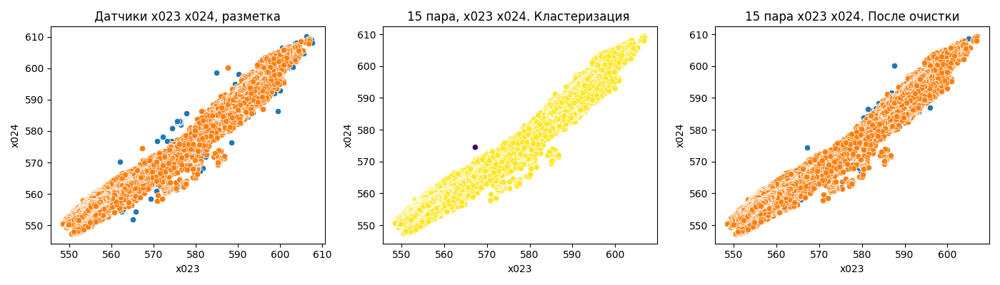

In [34]:
# Датафрейм для удаления аномалий
df_tres_clear_i = df_tres_clear.copy()

for i in (range(len(list_1_hicorr_names))):

    X = df_tres_clear_i[[list_1_hicorr_names[i], list_2_hicorr_names[i]]]
    clustering = DBSCAN(eps=2.5, min_samples=5).fit(X)  # Проводим кластеризацию
    # Определяем метку самого распространенного класса - это хорошие отсчеты
    num = Counter(clustering.labels_).most_common(1)[0][0]
    # Для меток всех остальных классов составляем массив индексов предполагаемых аномалий  
    drop_ind_i = np.delete(np.arange(df_tres_clear_i.shape[0]), np.where(clustering.labels_==num)[0], axis=0).astype(int)
            
    # Визуализация
    fig, axx = plt.subplots(1, 3, figsize=(14, 4))
    plt.sca(axx[0])
    sns.scatterplot(data=df_tres_clear, x=list_1_hicorr_names[i], y=list_2_hicorr_names[i])
    sns.scatterplot(data=df_train_mar, x=list_1_hicorr_names[i], y=list_2_hicorr_names[i])
    plt.title(f'Датчики {list_1_hicorr_names[i]} {list_2_hicorr_names[i]}, разметка')
    plt.sca(axx[1])
    sns.scatterplot(data=df_tres_clear_i, x=list_1_hicorr_names[i], y=list_2_hicorr_names[i], c=clustering.labels_)
    plt.title(f'{i} пара, {list_1_hicorr_names[i]} {list_2_hicorr_names[i]}. Кластеризация ')
    
    # Удаляем предполагаемые аномалии
    df_tres_clear_i = df_tres_clear_i.drop(drop_ind_i, axis=0).reset_index(drop=True)
    
    # Визуализация
    plt.sca(axx[2])
    sns.scatterplot(data=df_train_mar, x=list_1_hicorr_names[i], y=list_2_hicorr_names[i])
    sns.scatterplot(data=df_tres_clear_i, x=list_1_hicorr_names[i], y=list_2_hicorr_names[i])
    
    plt.title(f'{i} пара {list_1_hicorr_names[i]} {list_2_hicorr_names[i]}. После очистки')
    plt.tight_layout()
    plt.show()

In [35]:
print('Исходные данные', df_train_raw.shape)
print('Разметка', df_train_mar.shape)
print('Данные после очистки', df_tres_clear_i.shape)

Исходные данные (37339, 45)
Разметка (36816, 45)
Данные после очистки (36955, 45)


In [36]:
# Создаем метрику промежуточной оценки результатов для подбора параметров DBSCAN
raw = set(df_train_raw['Параметр'])
reference = set(df_train_mar['Параметр'])
result = set(df_tres_clear_i['Параметр'])

ref_deleted = raw - reference
deleted = raw - result

underdeleted = ref_deleted - deleted
overdeleted = deleted - ref_deleted
# Коэффициент 3 - штраф за недостаточное удаление в соответствием с алгоритмом оценки
metric = (len(overdeleted) + 3*len(underdeleted))/len(raw)*100
print(f'overdeleted {len(overdeleted)/len(raw)*100}')
print(f'underdeleted {len(underdeleted)/len(raw)*100}')
metric

overdeleted 0.25978199737539837
underdeleted 0.6320469214494229


2.1559227617236667